# Optimal Growth Model under discrete state space.

In [1]:
using BenchmarkTools
using Plots
using LinearAlgebra
using Profile # if use @profile, this statement is needed.
gr()

Plots.GRBackend()

In [2]:
struct Model
    # primitive parameter
    β::Float64 #subjective discount factor
    σ::Float64 # relative risk aversion
    δ::Float64 #depriciation rate
    α::Float64 # capital share

    # discretize asset space
    agrid::Array{Float64,1}

    # iteration settings
    maxiter::Int64
    tol::Float64

end

In [3]:
function Construct(na=300)
    β = 0.95 #subjective discount factor
    σ = 2.0 # relative risk aversion
    δ = 0.1 #depriciation rate
    α = 0.33 # capital share

    # Steady state

    aterm = 1.0/β -(1.0 -δ)
    kstar = α/aterm
    kstar = kstar^(1.0/(1.0-α))

    
    # asset grid
    amin = 0.1 * kstar
    amax = 2.0 * kstar
    
    agrid =collect(LinRange(amin, amax, na))
    
    #iteration settings
    maxiter = 10000
    tol = 1e-5

    return model = Model(β, σ, δ, α, agrid, maxiter,tol)
end

Construct (generic function with 2 methods)

In [4]:
function main(m::Model)

    # utility function
    u(c) = (c^(1.0-m.σ))/(1.0-m.σ)
    
    #grid size
    na = size(m.agrid, 1)

    #initialize value function and so on

    util = zeros(na,na) # utility matrix
    v0 = zeros(na) # initial guess of value function
    Tv = zeros(na) # update value function
    pol_a =zeros(na) # policy
    a_index::Array{Int64,1} = zeros(na)
    penalty = -1e10
    
    #create consuption and utility matrix        
    @inbounds for (i,today) in enumerate(m.agrid)
        resource =today^m.α + (1.0-m.δ)*today 
        @inbounds for (j,next) in enumerate(m.agrid)
            c = resource - next
            if c >= 0.0
                util[i,j] = u(c)
            else
                util[i,j] = penalty
            end
        end
    end
    
    # value function iteration
    for it in 1:m.maxiter
        
        #calculate temp value
        # monotonicity
        gridstart::Int64=1
        @inbounds for i in 1:na
            vmin = penalty
            @inbounds for j in gridstart:na
                v = util[i,j] + m.β * v0[j]
                if v > vmin
                    vmin = v
                    gridstart = j
                else
                    break # concavity 
                end
            end
            Tv[i] = vmin
            a_index[i] = gridstart
        end
       
        error = maximum(abs.(Tv-v0)) # update error
        v0    = copy(Tv) # update value function

        if error < m.tol
        
        for i in 1:na
            @inbounds pol_a[i]   = m.agrid[a_index[i]]
        end
            break
        end
            
    end
    
    return v0,pol_a
end

main (generic function with 1 method)

In [5]:
m = Construct()

Model(0.95, 2.0, 0.1, 0.33, [0.316086, 0.336172, 0.356257, 0.376343, 0.396429, 0.416515, 0.4366, 0.456686, 0.476772, 0.496858  …  6.14095, 6.16103, 6.18112, 6.20121, 6.22129, 6.24138, 6.26146, 6.28155, 6.30163, 6.32172], 10000, 1.0e-5)

In [6]:
vfun, pol_a =main(m)

([-22.9342, -22.7952, -22.6642, -22.5402, -22.4225, -22.3105, -22.2035, -22.1011, -22.0029, -21.9085  …  -15.7472, -15.7387, -15.7302, -15.7217, -15.7133, -15.705, -15.6966, -15.6883, -15.68, -15.6717], [0.496858, 0.516943, 0.537029, 0.557115, 0.577201, 0.597286, 0.617372, 0.637458, 0.657543, 0.677629  …  5.81958, 5.81958, 5.83966, 5.85975, 5.87983, 5.89992, 5.92001, 5.94009, 5.96018, 5.98026])

In [7]:
@time main(m);

  0.005137 seconds (687 allocations: 2.347 MiB)


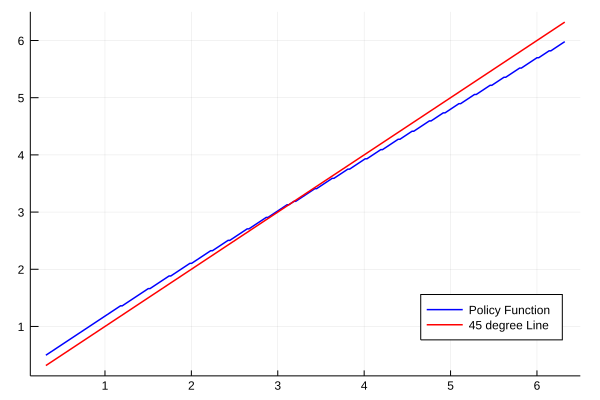

In [8]:
plot(m.agrid, pol_a, color="blue", linewidth=1.5, label="Policy Function",legend=:bottomright)
plot!(m.agrid, m.agrid, color="red", linewidth=1.5, label="45 degree Line",legend=:bottomright)

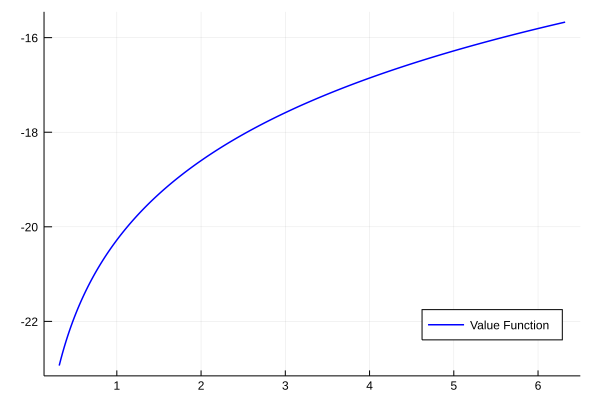

In [9]:
plot(m.agrid, vfun, color="blue", linewidth=1.5, label="Value Function",legend=:bottomright)

In [10]:
@benchmark main(m)

BenchmarkTools.Trial: 
  memory estimate:  2.35 MiB
  allocs estimate:  683
  --------------
  minimum time:     2.583 ms (0.00% GC)
  median time:      4.647 ms (0.00% GC)
  mean time:        5.308 ms (11.54% GC)
  maximum time:     28.569 ms (0.00% GC)
  --------------
  samples:          938
  evals/sample:     1